## DM-27370: "Monthly" reprocessing of HiTS with the AP Pipeline

This was no regular reprocessing run. Lots of things were new and different!

* All in Gen3, starting from raws, in two separate repos (note: should have done it all in one repo)
* Built calibs in Gen3 for the 3 usual fields in HiTS 2014 and 2015
* Made "decent-seeing" coadds from HiTS 2014 in Gen3 by manually selecting visits. Unlike in the Gen2 best seeing selector, I used the same visits for all detectors. As a result, each patch has somewhat fewer constituent visits than before. Two major differences: first, the templates are a bit shallower with only 7-8 visits per patch _on average_ instead of 10-15, and second, the coverage is more consistent --- the Gen2 templates have anywhere from 6-29 visits per patch. 
* Significant housekeeping: imported reference catalogs, dealt with skymaps, defined visits from exposures, etc.
* Imported coadds from "the repo where I made the templates" to "the repo where I put the science images"
* Finally, I ran the AP Pipeline in Gen3 for all 84 HiTS 2015 visits in 3 fields

**NOTE**: None of the data products have linearity or crosstalk corrections, because those haven't been implemented for DECam in Gen3 quite yet (see [DM-23985](https://jira.lsstcorp.org/browse/DM-23985) and [DM-27833](https://jira.lsstcorp.org/browse/DM-27833), respectively)

Once I used the fix in [DM-28418](https://jira.lsstcorp.org/browse/DM-28418), running ~25k quanta through the AP Pipeline took about 21 hours when I used `-j 12`. This is the exact command I ran:

```
make_apdb.py -c isolation_level=READ_UNCOMMITTED -c db_url="sqlite:////project/mrawls/hits2015-3/association-DM-27370-2.db"

nohup pipetask run -j 12 -b /project/mrawls/hits2015-3 -d "exposure IN (410915, 410929, 410931, 410971, 410985, 410987, 411021, 411035, 411037, 411055, 411069, 411071, 411255, 411269, 411271, 411305, 411319, 411321, 411355, 411369, 411371, 411406, 411420, 411422, 411456, 411470, 411472, 411657, 411671, 411673, 411707, 411721, 411724, 411758, 411772, 411774, 411808, 411822, 411824, 411858, 411872, 411874, 412060, 412074, 412076, 412250, 412264, 412266, 412307, 412321, 412324, 412504, 412518, 412520, 412554, 412568, 412570, 412604, 412618, 412620, 412654, 412668, 412670, 412704, 412718, 412720, 413635, 413649, 413651, 413680, 413694, 413696, 415314, 415328, 415330, 415364, 415378, 415380, 419791, 419802, 419804, 421590, 421604, 421606)" -i DECam/raw/all,DECam/calib,DECam/calib/DM-26971,refcats/gen2,skymaps,DECam/templates/DM-27370/20210108T034942Z -o DECam/ApPipe/DM-27370-2 -p /project/mrawls/hits2015-3/ApPipe.yaml -c diaPipe:apdb.db_url="sqlite:////project/mrawls/hits2015-3/association-DM-27370-2.db" -c diaPipe:apdb.connection_timeout=240 --register-dataset-types> ApPipe-DM-27370-2.out &
```

So how did it go? Let's take a look...

In [68]:
%matplotlib notebook

import os
import sys
import numpy as np
import matplotlib.pyplot as plt
import importlib
import pandas as pd
#import psycopg2

from astropy.coordinates import SkyCoord
import astropy.units as u

import lsst.daf.butler as dafButler
from lsst.ap.association import UnpackApdbFlags, MapDiaSourceConfig
from lsst.obs.decam import DarkEnergyCamera

In [2]:
sys.path.append('/project/mrawls/ap_pipe-notebooks/')
import diaObjectAnalysis as doa
import apdbPlots as pla
import plotLightcurve as plc

In [109]:
# Only if you change anything in the code imported above
importlib.reload(doa)
importlib.reload(pla)
importlib.reload(plc)

<module 'plotLightcurve' from '/project/mrawls/ap_pipe-notebooks/plotLightcurve.py'>

In [3]:
repo = '/project/mrawls/hits2015-3'

In [4]:
objTable, srcTable, goodObj, goodSrc = pla.loadTables(repo, dbName='association-DM-27370-2.db')

<IPython.core.display.Javascript object>


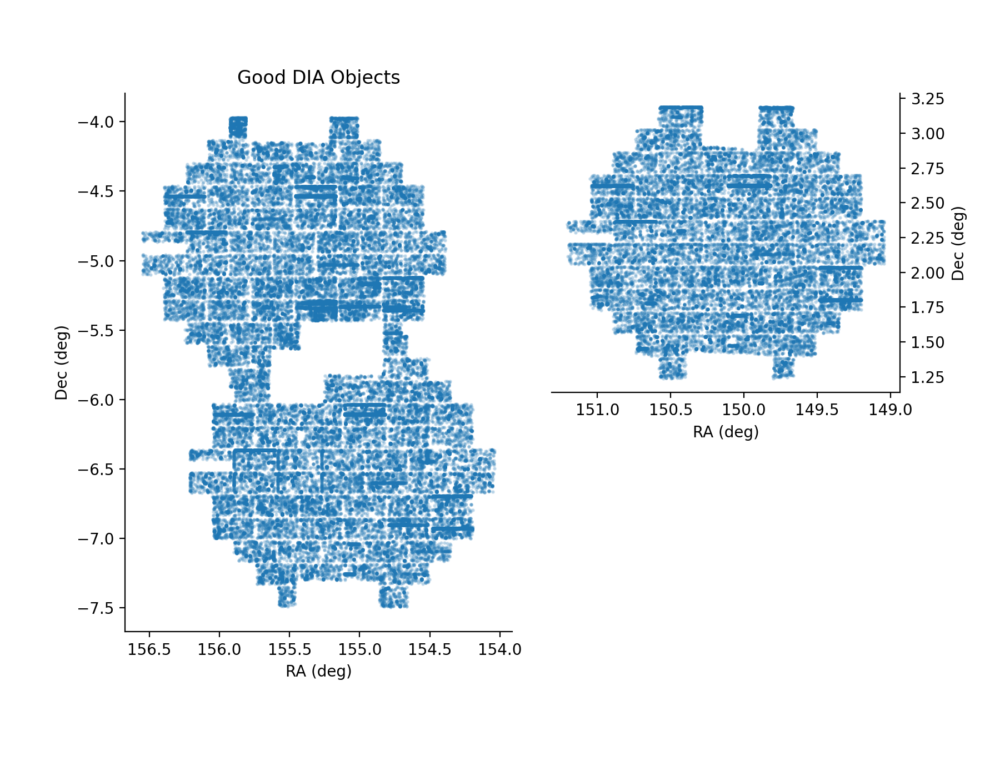

In [5]:
hitsPlot = pla.plotHitsSourcesOnSky(goodObj, title='Good DIA Objects')

Well well... Gen3 seems to have taken a few bites out of our fields and brought back a whole bunch of known bad things that ought to be masked (like edges, bad columns, etc.)...

<IPython.core.display.Javascript object>


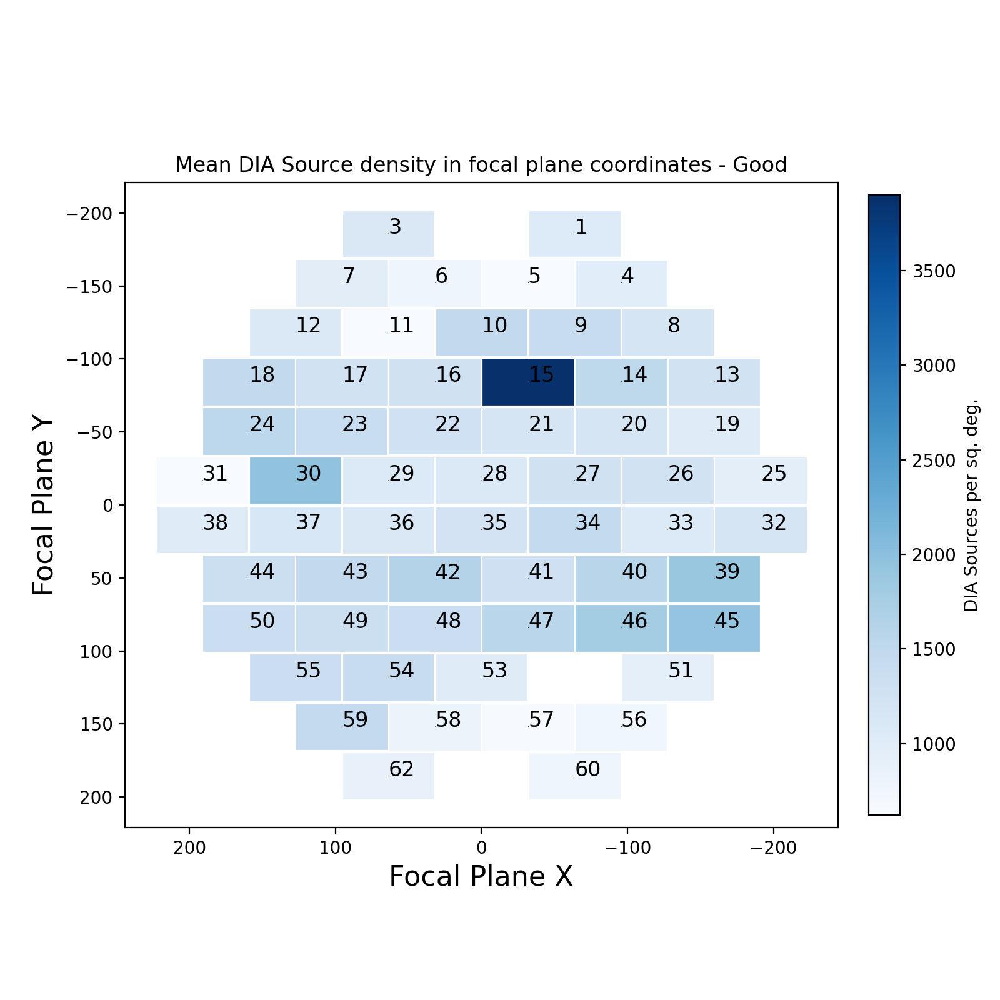

In [110]:
pla.plotDiaSourceDensityInFocalPlane(repo, goodSrc, title='- Good', gen='gen3', instrument='DECam',
                               collections=['DECam/ApPipe/DM-27370-2'])

<IPython.core.display.Javascript object>


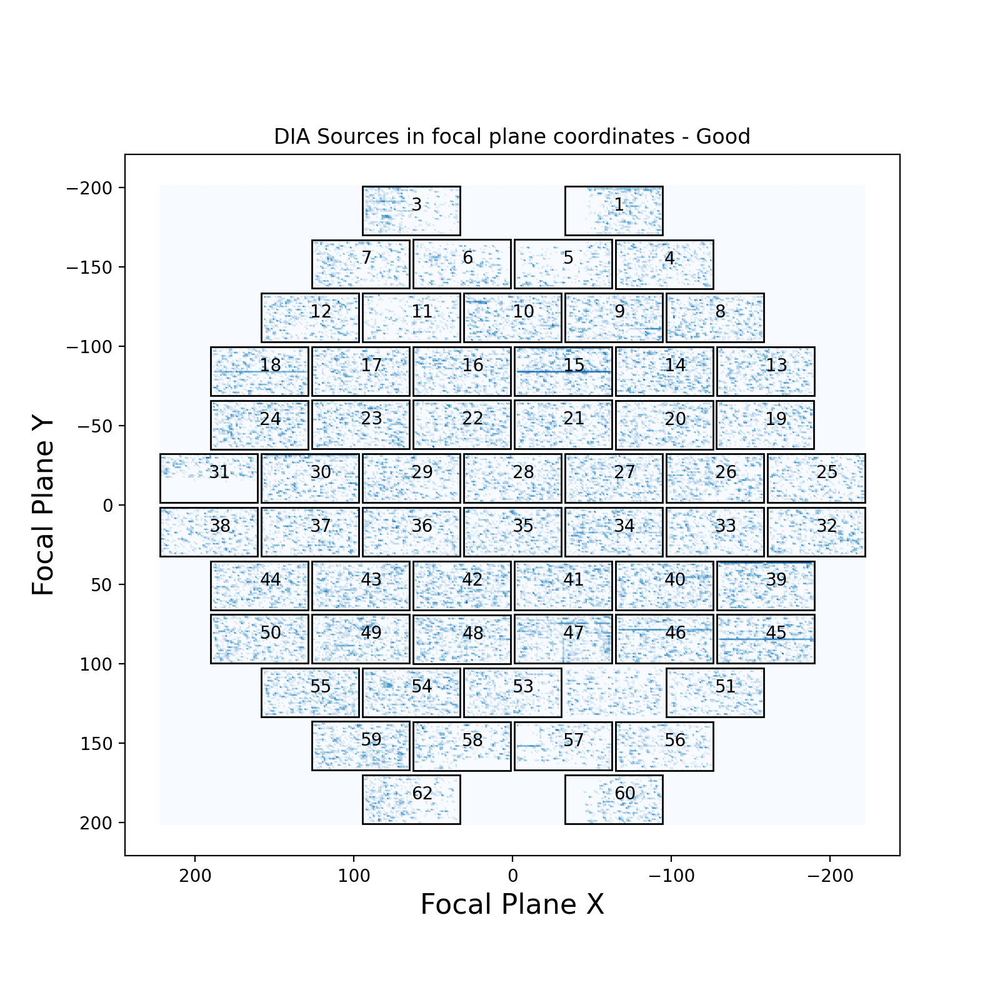

In [95]:
pla.plotDiaSourcesInFocalPlane(repo, goodSrc, title='- Good', gen='gen3', instrument='DECam',
                               collections=['DECam/ApPipe/DM-27370-2'])

<IPython.core.display.Javascript object>


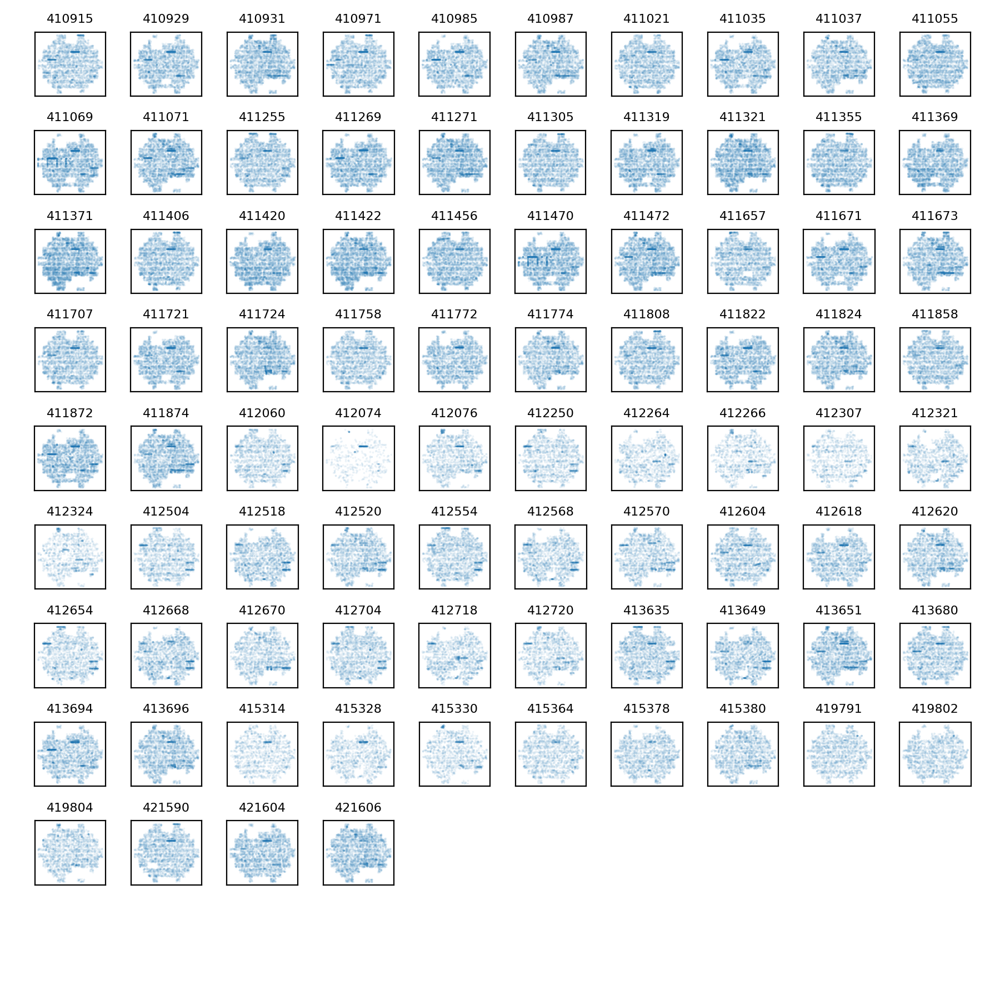

In [96]:
pla.plotDiaSourcesOnSkyGrid(repo, goodSrc)

<IPython.core.display.Javascript object>


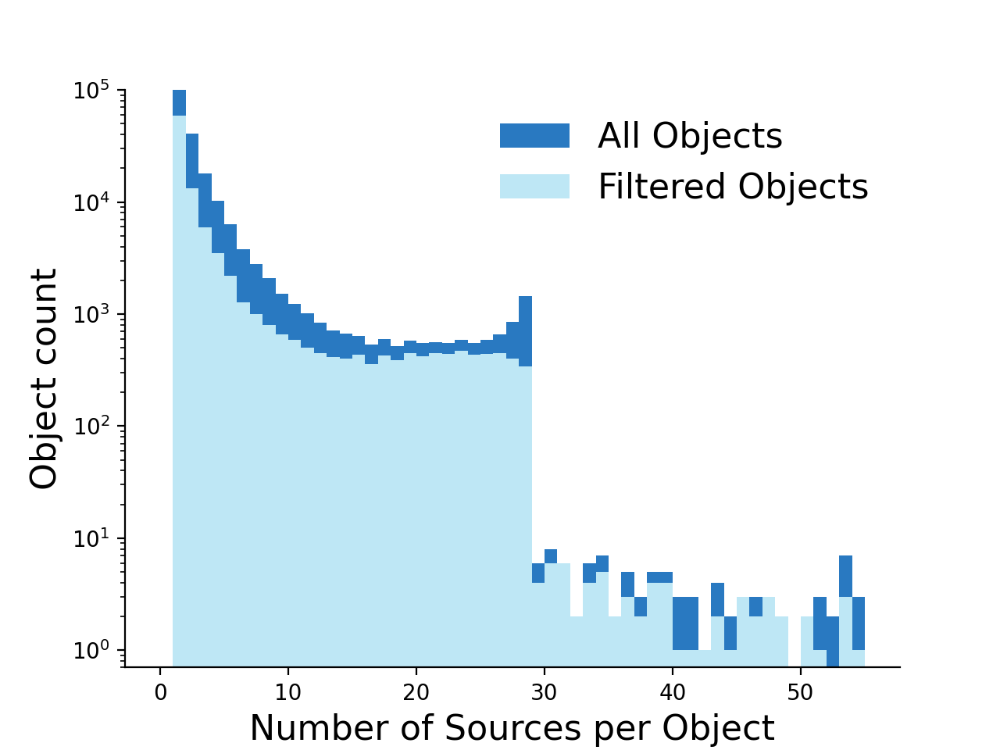

In [102]:
hist = doa.plotDiaObjectHistogram(objTable, goodObj)

## Difference image flux (`psFlux`) and calexp flux (`totFlux`) distributions

In [97]:
def plotFluxHistSrc(srcTable1, srcTable2=None, fluxType='psFlux', label1=None, label2=None, title=None, ylog=False):
    plt.figure(figsize=(7, 5))
    plt.xlabel(fluxType, size=12)
    plt.ylabel('DIA Source count', size=12)
    #bins = np.concatenate((-1*np.flip(np.logspace(-1, 6, 50)), np.logspace(-1, 6, 50)))
    bins = np.linspace(-1e4, 1e4, 200)
    if ylog:
        plt.yscale('log')
    #plt.xscale('symlog')
    plt.hist(srcTable1[fluxType].values, bins=bins, color='#2979C1', label=label1)
    if srcTable2 is not None:
        plt.hist(srcTable2[fluxType].values, bins=bins, color='#Bee7F5', label=label2)
    if label1:
        plt.legend(frameon=False, fontsize=12)
    plt.gca().spines['top'].set_visible(False)
    plt.gca().spines['right'].set_visible(False)
    plt.title(title)

<IPython.core.display.Javascript object>


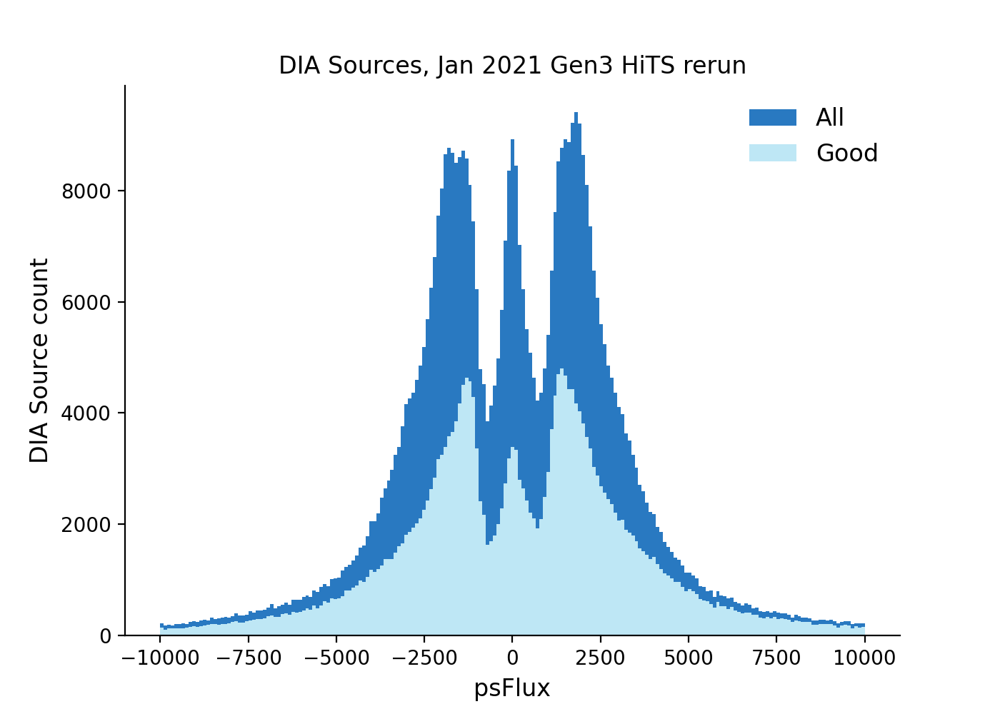

In [100]:
plotFluxHistSrc(srcTable, goodSrc, fluxType='psFlux', label1='All', label2='Good',
                title='DIA Sources, Jan 2021 Gen3 HiTS rerun')

<IPython.core.display.Javascript object>


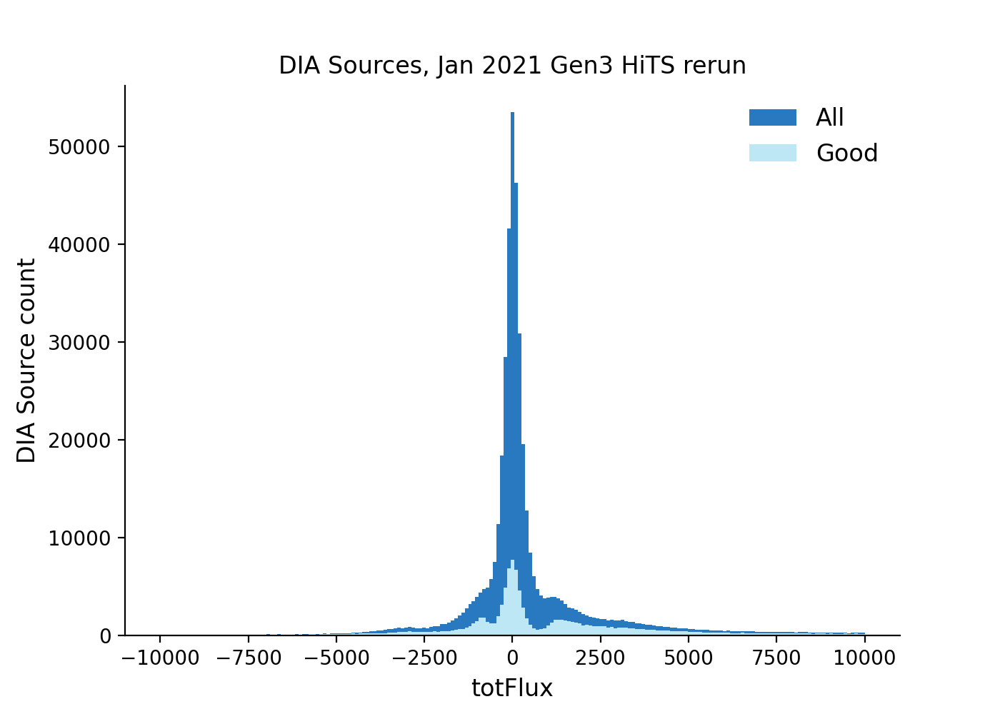

In [101]:
plotFluxHistSrc(srcTable, goodSrc, fluxType='totFlux', label1='All', label2='Good',
                title='DIA Sources, Jan 2021 Gen3 HiTS rerun')

## Comparing to previous rerun in Gen2 (with different templates etc.)

In [111]:
repo_old = '/project/mrawls/hits2015/rerun/cw_2020_11'

In [112]:
objTable_old, srcTable_old, goodObj_old, goodSrc_old = pla.loadTables(repo_old)

In [113]:
print(len(srcTable), len(srcTable_old))
print(len(goodSrc), len(goodSrc_old))
print(len(objTable), len(objTable_old))
print(len(goodObj), len(goodObj_old))

728177 647018
284189 226858
283936 225889
95472 57795


<IPython.core.display.Javascript object>


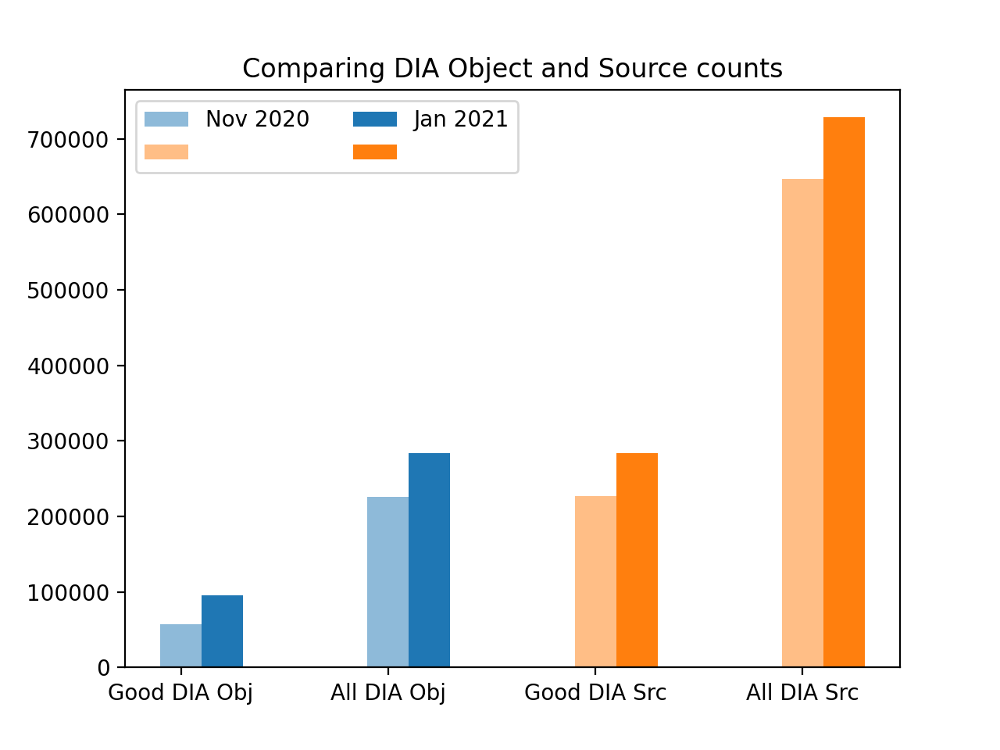

Text(0.5, 1.0, 'Comparing DIA Object and Source counts')

In [114]:
srcTable1 = srcTable_old
goodSrc1 = goodSrc_old
objTable1 = objTable_old
goodObj1 = goodObj_old
label1 = "Nov 2020"

srcTable2 = srcTable
goodSrc2 = goodSrc
objTable2 = objTable
goodObj2 = goodObj
label2 = "Jan 2021"

#srcTable3 = srcTable_older
#goodSrc3 = goodSrc_older
#objTable3 = objTable_older
#goodObj3 = goodObj_older
#label3 = "Jul 2020"

fig, ax = plt.subplots()
barLabels = ['Good DIA Obj', 'All DIA Obj', 'Good DIA Src', 'All DIA Src']
xbar = np.array([0, 1])
width = 0.2

# Nov 2020
ax.bar(xbar, [len(goodObj1), len(objTable1)], 
       width, label=label1, color='C0', alpha=0.5)
ax.bar(xbar + 2, [len(goodSrc1), len(srcTable1)],
       width, label=' ', color='C1', alpha=0.5)

# Jan 2021
ax.bar(xbar + width, [len(goodObj2), len(objTable2)], 
       width, label=label2, color='C0')
ax.bar(xbar + 2 + width, [len(goodSrc2), len(srcTable2)],
       width, label=' ', color='C1')

# Older
#ax.bar(xbar + width, [len(goodObj3), len(objTable3)], 
#       width, label=label3, color='C0', alpha=0.2)
#ax.bar(xbar + 2 + width, [len(goodSrc3), len(srcTable3)],
#       width, label=' ', color='C1', alpha=0.2)

#plt.legend(ncol=3)
plt.legend(ncol=2)
ax.set_xticks([0, 1, 2, 3])
labels = ax.set_xticklabels(barLabels)
plt.title('Comparing DIA Object and Source counts')

<IPython.core.display.Javascript object>


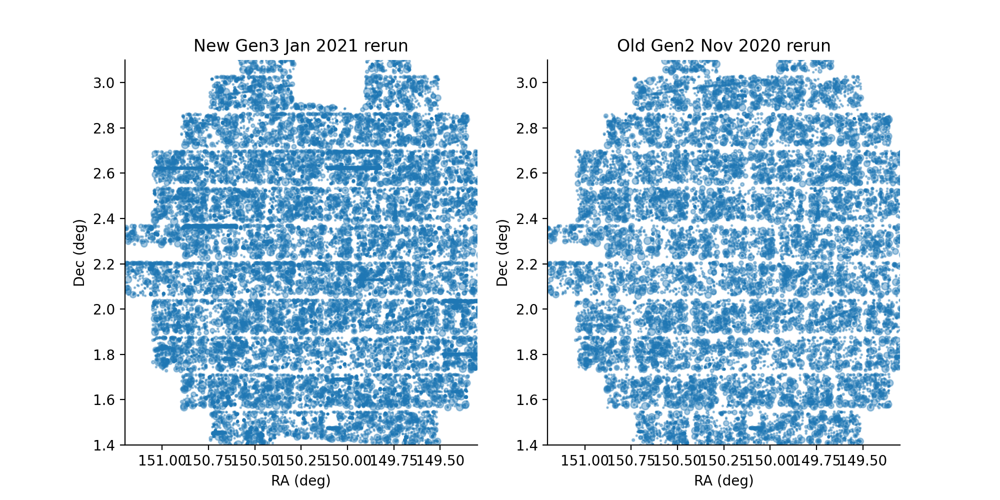

Text(0.5, 1.0, 'Old Gen2 Nov 2020 rerun')

In [115]:
fig = plt.figure(figsize=(10,5))

xlim = (151.2, 149.3)
ylim = (1.4, 3.1)

ax = fig.add_subplot(121)
plt.setp(ax, xlim=xlim, ylim=ylim)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.scatter(goodObj['ra'], goodObj['decl'], c='C0', s=goodObj['nDiaSources'], marker='o', alpha=0.4)
ax.set_xlabel('RA (deg)')
ax.set_ylabel('Dec (deg)')
ax.set_title('New Gen3 Jan 2021 rerun')

ax2 = fig.add_subplot(122)
plt.setp(ax2, xlim=xlim, ylim=ylim)
ax2.spines['top'].set_visible(False)
ax2.spines['right'].set_visible(False)
ax2.scatter(goodObj_old['ra'], goodObj_old['decl'], c='C0', s=goodObj_old['nDiaSources'], marker='o', alpha=0.4)
ax2.set_xlabel('RA (deg)')
ax2.set_ylabel('Dec (deg)')
ax2.set_title('Old Gen2 Nov 2020 rerun')

## Examine the flags on the DIA Sources

In [174]:
def plot_flag_hist(flags, labels, title=None):
    assert len(flags) == len(labels)
    assert len(flags) == 29  # because we're doing custom slicing below

    fig, ax = plt.subplots(figsize=(9,9))

    # Manually make the three "bad" flags red and the rest blue
    # The default "bad" flags are bad, suspect, and saturated center
    flagColors = ['C0', 'C0', 'C0', 'C0', 'C0', 'C0', 'C3', 'C3', 'C0', 'C3',
                  'C0', 'C0', 'C0', 'C0', 'C0', 'C0', 'C0', 'C0', 'C0', 'C0',
                  'C0', 'C0', 'C0', 'C0', 'C0', 'C0', 'C0', 'C0', 'C0']
    assert len(flagColors) == len(flags)
    goodFlags = ax.barh(labels, flags, color=flagColors)

    #ax.xaxis.set_tick_params(rotation=89)
    fig.subplots_adjust(left=0.35)
    ax.set_xlabel('Number of flagged DIASources')
    plt.gca().spines['top'].set_visible(False)
    plt.gca().spines['right'].set_visible(False)
    plt.title(title)

    #pixelflags = ax.barh(labels[0:8], flags[0:8], color='C0')
    #pixelcenterflags = ax.barh(labels[8:12], flags[8:12], color='C1')
    #centroidflags = ax.barh(labels[12:15], flags[12:15], color='C4')
    #apfluxflags = ax.barh(labels[15:17], flags[15:17], color='C6')
    #psffluxflags = ax.barh(labels[17:20], flags[17:20], color='C2')
    #ip_diffimflags = ax.barh(labels[20:23], flags[20:23], color='C5')
    #shapeflags = ax.barh(labels[23::], flags[23::], color='C3')

    #ax.legend((pixelflags[0],
    #           pixelcenterflags[0],
    #           centroidflags[0],
    #           apfluxflags[0], 
    #           psffluxflags[0],
    #           ip_diffimflags[0],
    #           shapeflags[0]), 
    #          ('Pixel flags', 
    #           'Pixel center flags',
    #           'Centroid flags',
    #           'ApFlux flags',
    #           'PsfFlux flags',
    #           'ip_diffim flags',
    #           'Shape flags'),
    #          frameon=False, loc='upper right', ncol=2
    #         )

In [177]:
config = MapDiaSourceConfig()
unpacker = UnpackApdbFlags(config.flagMap, 'DiaSource')
flag_values = unpacker.unpack(srcTable['flags'], 'flags')
flag_names = list(flag_values.dtype.names)
#print(flag_names)
flagTable = pd.DataFrame(flag_values, index=srcTable.index)
flagSum = flagTable.sum()
flagsToPlot = [count for count in flagSum.values]
#print(flagsToPlot)

<IPython.core.display.Javascript object>


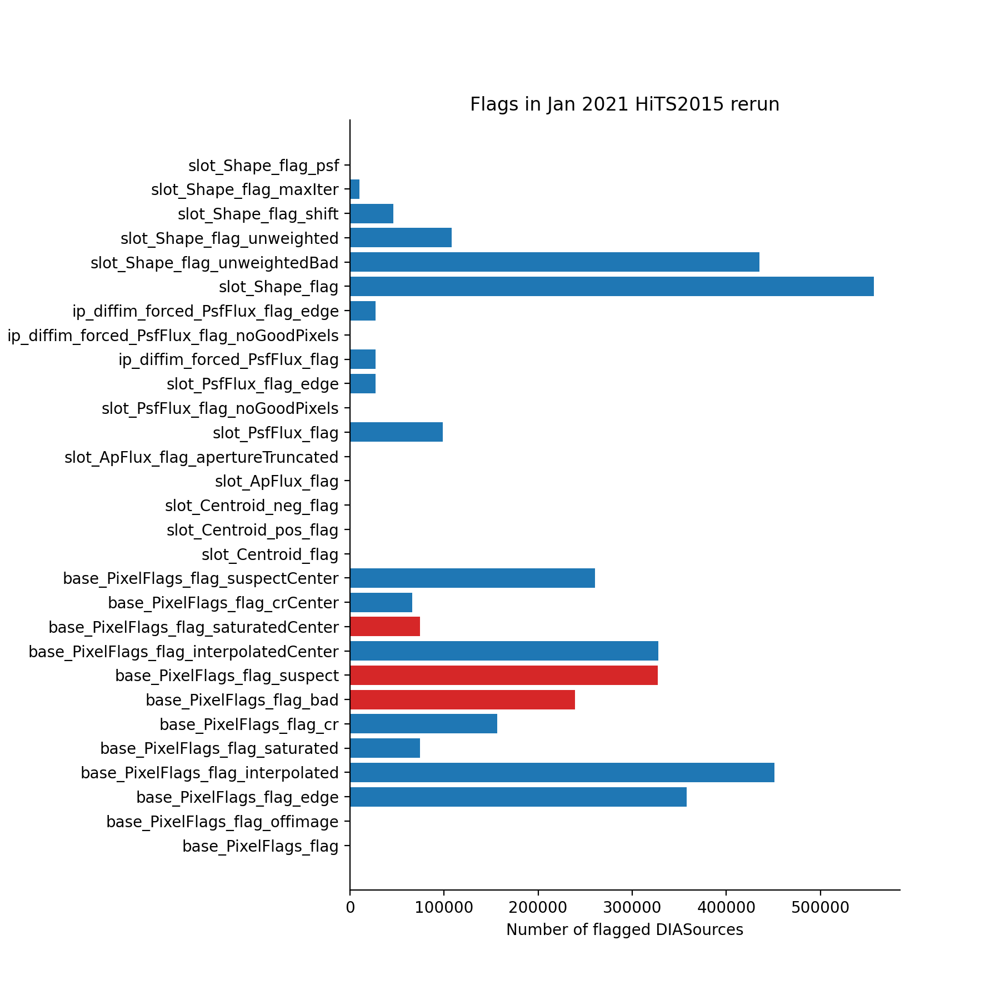

In [176]:
plot_flag_hist(flagsToPlot, flag_names, title='Flags in Jan 2021 HiTS2015 rerun')

In [184]:
# Actually add the flag info into a the srcTable for plotting purposes
flagTable, srcTableFlags, flagFilter, _, _ = pla.makeSrcTableFlags(srcTable, objTable)

In [212]:
def spatial_flag_plot(df, flagName1, flagName2=None, operator=None, plotFlagged=True, plotUnFlagged=True, title=''):
    if flagName2 and operator:
        if operator == 'or':
            flagFilter = ((df[flagName1]) | (df[flagName2]))
            labelTrue = flagName1 + ' \nor ' + flagName2
            labelFalse = 'Neither ' + flagName1 + ' \nnor ' + flagName2
        elif operator == 'and':
            flagFilter = ((df[flagName1]) & (df[flagName2]))
            labelTrue = 'Both ' + flagName1 + ' \nand ' + flagName2
            labelFalse = 'Not ' + flagName1 + ' \nand ' + flagName2
        else:
            raise ValueError('Operator must be \'and\' or \n \'or\'')
    elif flagName2 and not operator:
        raise ValueError('Operator must be set if a second flag is given')
    else:  # just considering one flag
        flagFilter = (df[flagName1])
        labelTrue = flagName1
        labelFalse = 'No ' + flagName1
    flagFilterInverse = ~flagFilter
    
    fig, ax = plt.subplots(figsize=(9,6))
    if plotFlagged:
        scatterFlagged = ax.scatter(df.loc[flagFilter, 'ra'], df.loc[flagFilter, 'decl'], 
                    color='C3', s=5, alpha=0.2, label=labelTrue)
    if plotUnFlagged:
        scatterUnflagged = ax.scatter(df.loc[flagFilterInverse, 'ra'], df.loc[flagFilterInverse, 'decl'], 
                    color='C0', s=5, alpha=0.2, label=labelFalse)
    print('Flagged sources: {0}'.format(len(df.loc[flagFilter, 'ra'])))
    print('Unflagged sources: {0}'.format(len(df.loc[flagFilterInverse, 'ra'])))
    ax.set_xlabel('RA (deg)')
    ax.set_ylabel('Dec (deg)')
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    
    xlim = (150.8, 149.8)
    ylim = (2.4, 3.1)
    plt.setp(ax, xlim=xlim, ylim=ylim)
    
    #ax.invert_xaxis()
    #box = ax.get_position()
    #ax.set_position([box.x0, box.y0, box.width * 0.8, box.height])
    #ax.legend(bbox_to_anchor=(0.9, 0.9))
    
    plt.title(title)

<IPython.core.display.Javascript object>


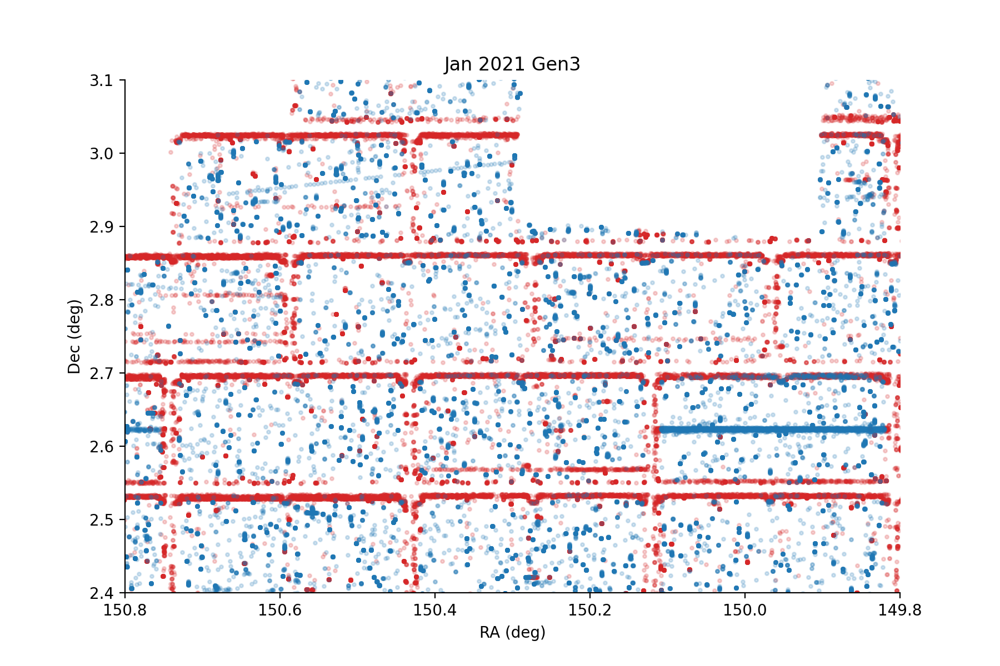

Flagged sources: 436282
Unflagged sources: 291895


In [213]:
spatial_flag_plot(srcTableFlags, 'base_PixelFlags_flag_edge', 'base_PixelFlags_flag_suspect', operator='or',
                  title='Jan 2021 Gen3')

In [200]:
# Compare what the flags looked like in the gen2 rerun
flagTable_old, srcTableFlags_old, flagFilter_old, _, _ = pla.makeSrcTableFlags(srcTable_old, objTable_old)

<IPython.core.display.Javascript object>


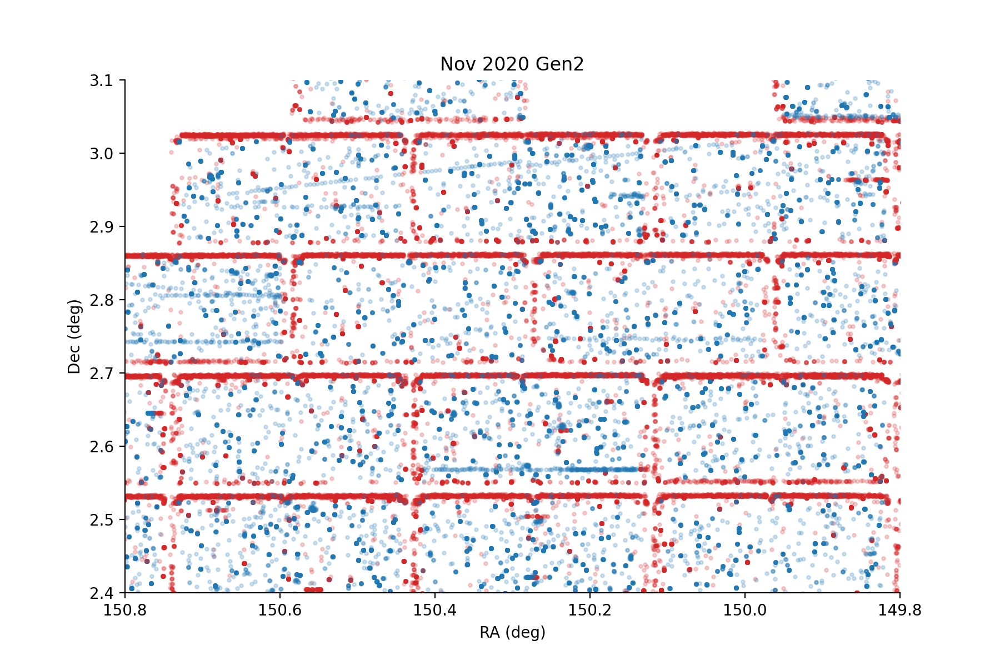

Flagged sources: 367453
Unflagged sources: 279565


In [214]:
spatial_flag_plot(srcTableFlags_old, 'base_PixelFlags_flag_edge', 'base_PixelFlags_flag_suspect', operator='or',
                  title='Nov 2020 Gen2')